In [1]:
%load_ext autoreload
%autoreload 2

from sklearn.utils import shuffle


import numpy as np
import pandas as pd
import random

pd.options.display.max_rows = 100
pd.options.display.max_columns = 200


import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.append("../")
import src

from sklearn.dummy import DummyClassifier

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OrdinalEncoder

import lightgbm as lgb
import optuna.integration.lightgbm as olgb

from sklearn.metrics import auc
from sklearn.metrics import log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_auc_score

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification


from scipy.misc import derivative

import types

import optuna

from sklearn.calibration import CalibratedClassifierCV
from sklearn.calibration import IsotonicRegression
from sklearn.calibration import calibration_curve
from sklearn.linear_model import LogisticRegression

In [2]:
def focal_loss_lgb(y_pred, dtrain, alpha, gamma):
    """
    Adapation of the Focal Loss for lightgbm to be used as loss function.
    Parameters:
    -----------
        y_pred: numpy.ndarray
            array with the predictions
        dtrain: lightgbm.Dataset
        alpha, gamma: float
            See original paper https://arxiv.org/pdf/1708.02002.pdf
    
    Returns:
    ---------
        grad: float, 
        hess: float
        
    """
    
    a,g = alpha, gamma
    y_true = dtrain.label
    
    def fl(x,t):
        p = 1/(1+np.exp(-x))
        return -( a*t + (1-a)*(1-t) ) * (( 1 - ( t*p + (1-t)*(1-p)) )**g) * ( t*np.log(p)+(1-t)*np.log(1-p) )
    
    partial_fl = lambda x: fl(x, y_true)
    grad = derivative(partial_fl, y_pred, n=1, dx=1e-6)
    hess = derivative(partial_fl, y_pred, n=2, dx=1e-6)
    
    return grad, hess

In [3]:
def focal_loss_lgb_eval_error(y_pred, dtrain, alpha, gamma):
    """
    Adapation of the Focal Loss for lightgbm to be used as evaluation loss.
    Parameters:
    -----------
        y_pred: numpy.ndarray
            array with the predictions
        dtrain: lightgbm.Dataset
        alpha, gamma: float
            See original paper https://arxiv.org/pdf/1708.02002.pdf
    
    Returns:
        name: str, 
        eval_result: float, 
        is_higher_better: bool  
        
    """
    a,g = alpha, gamma
    y_true = dtrain.label

    p = 1/(1+np.exp(-y_pred))
    loss = -( a*y_true + (1-a)*(1-y_true) ) * (( 1 - ( y_true*p + (1-y_true)*(1-p)) )**g) * ( y_true*np.log(p)+(1-y_true)*np.log(1-p) )
    
    # (eval_name, eval_result, is_higher_better)
    return 'focal_loss', np.mean(loss), False

In [4]:
def predict_proba(self, dataframe):
    '''
    custom to predict probability from lgbm raw results
    (lgbm returns raw results when using a custom loss function)
    '''
    raw = self.predict(dataframe)
    return 1/(1+np.exp(-raw))

# DATA AND MODEL PARAMETERS

In [5]:
from sklearn.datasets import make_classification
data_array = make_classification(n_samples = 10000, 
                                 n_features = 10, 
                                 weights = [0.98,0.02], 
                                 class_sep = 1.0,
                                random_state = 42)

In [6]:
data = pd.DataFrame(data_array[0])
data.columns = ['col_'+str(i) for i in data.columns]
data['label'] = data_array[1]
data.reset_index(inplace=True)

In [7]:
data.head(2)

,index,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,label
0,0,1.195860,0.357385,-0.665862,-0.492845,-0.863395,-0.050796,-1.933989,2.081684,0.041266,-0.258298,0
1,1,0.825314,1.109459,-0.323136,-1.419545,-1.593368,1.107295,1.243526,-0.172200,1.150359,0.147744,0


In [8]:
data.describe()

,index,col_0,col_1,col_2,col_3,col_4,col_5,col_6,col_7,col_8,col_9,label
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,4999.50000,0.003250,0.003903,0.120238,-0.967147,-0.894866,0.014532,-0.002512,-0.001898,-0.012542,-0.003416,0.025300
std,2886.89568,1.267906,1.005729,0.764418,0.968775,1.047744,1.000096,1.004102,0.992369,1.002552,1.000748,0.157043
min,0.00000,-4.635391,-4.462969,-1.881576,-5.049091,-5.158302,-3.532818,-4.295391,-3.726141,-4.465604,-4.157734,0.000000
25%,2499.75000,-0.999532,-0.664960,-0.497676,-1.494997,-1.527215,-0.664192,-0.681312,-0.685000,-0.707069,-0.679929,0.000000
50%,4999.50000,0.629882,0.005681,-0.191287,-0.987263,-1.089817,0.023993,0.003465,-0.005517,-0.009686,0.002068,0.000000
75%,7499.25000,1.018348,0.675301,0.727401,-0.473078,-0.433265,0.690098,0.684130,0.671650,0.677710,0.670808,0.000000
max,9999.00000,3.151655,3.691625,2.842699,3.853140,4.412631,3.727833,3.605591,3.760155,3.335268,3.536048,1.000000


In [9]:
categorical_features = []
numerical_features = ['col_0','col_1','col_2','col_3','col_4','col_5','col_6','col_7','col_8','col_9']
id_column = 'index'
target_column = 'label'

In [10]:
print(f"null values for all columns:\n----------------------- \n{data.isna().sum()}")

null values for all columns:
----------------------- 
index    0
col_0    0
col_1    0
col_2    0
col_3    0
col_4    0
col_5    0
col_6    0
col_7    0
col_8    0
col_9    0
label    0
dtype: int64


In [11]:
print(f"data types for all columns:\n----------------------- \n{data.dtypes}")

data types for all columns:
----------------------- 
index      int64
col_0    float64
col_1    float64
col_2    float64
col_3    float64
col_4    float64
col_5    float64
col_6    float64
col_7    float64
col_8    float64
col_9    float64
label      int64
dtype: object


In [12]:
print(f"categories for categorical columns \n ------------------------------")
for i in categorical_features:
    print(f"{i}: {data[i].unique()} \n _____")

categories for categorical columns 
 ------------------------------


In [13]:
print(f"data balance: {round(data.loc[data[target_column]==1].shape[0]/data.shape[0]*100,2)} %")
data.shape

data balance: 2.53 %


(10000, 12)

### PCA

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(data.loc[:,categorical_features+numerical_features])
pca_values = pca.transform(data.loc[:,categorical_features+numerical_features])

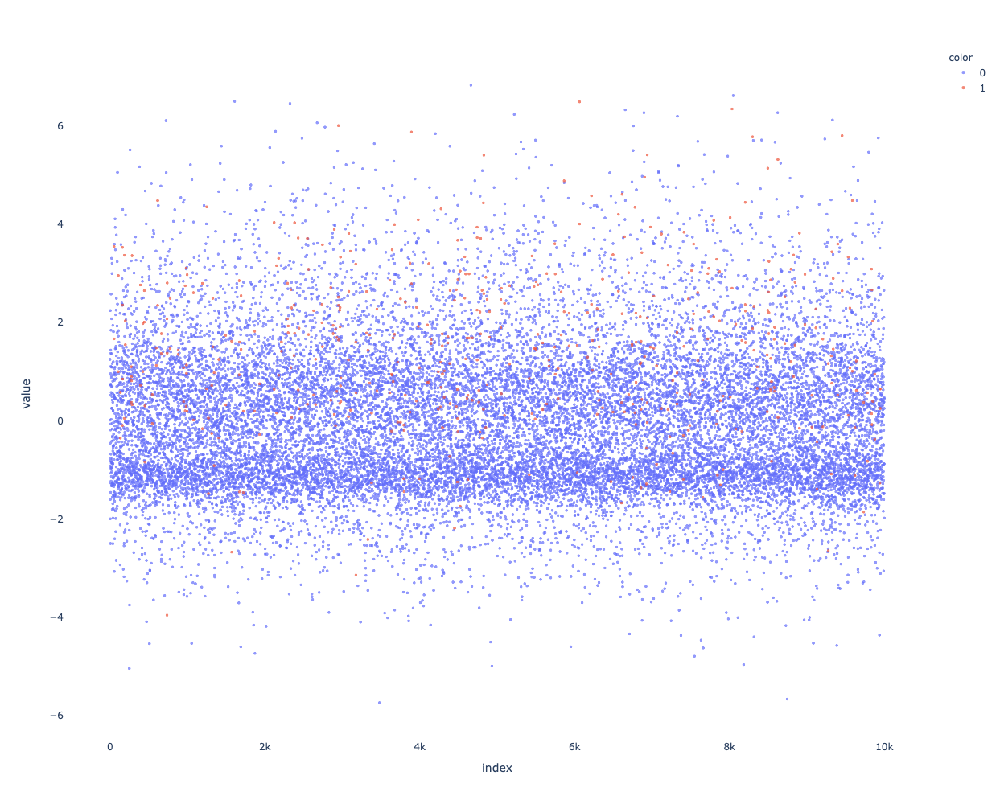

In [15]:
fig = px.scatter(pca_values, color = [str(i) for i in data[target_column].values], opacity = 0.7)
fig.update_layout(width = 1000,
                  height = 1000,
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_traces(marker=dict(size=4))

fig.show()

# EXPLORE DATA

### Visualize Input Data

In [16]:
# Categorical
# Para cada categoria, cuantos en la clase 1 y cuantos en la clase 0

for variable in categorical_features:
    fig = px.bar(data.groupby(by=[variable,'TARGET'])['ID'].count().reset_index().astype({'TARGET':'object'}),
                 x= variable, 
                 y = id_column,
                 color = target_column,
                 barmode = 'group',
                 opacity = 0.7)
    
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)')
    fig.show()

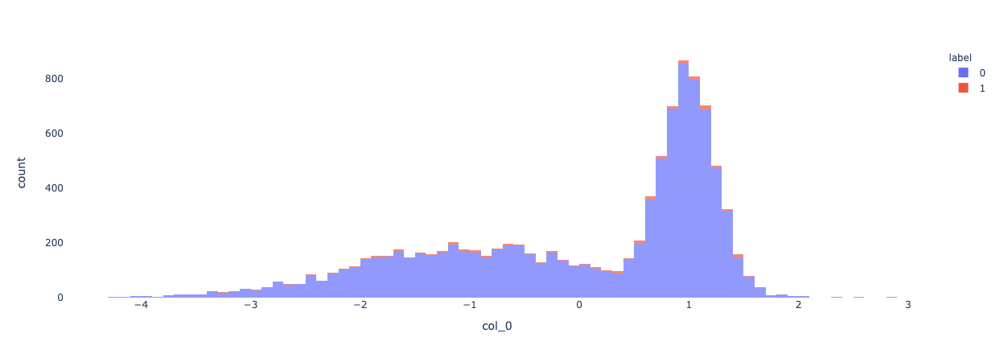

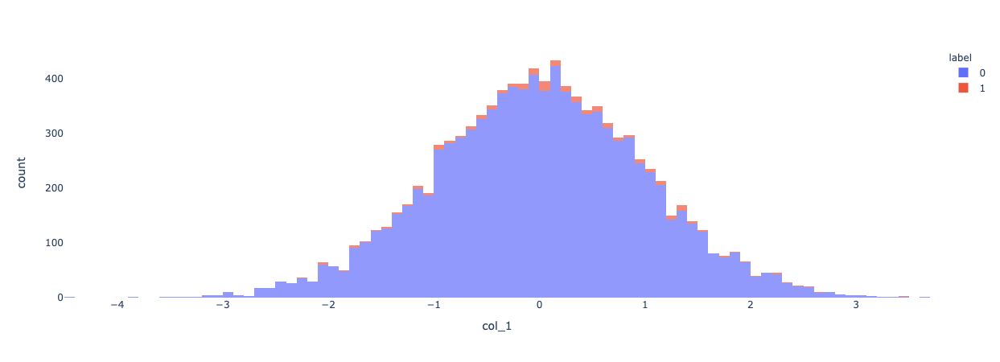

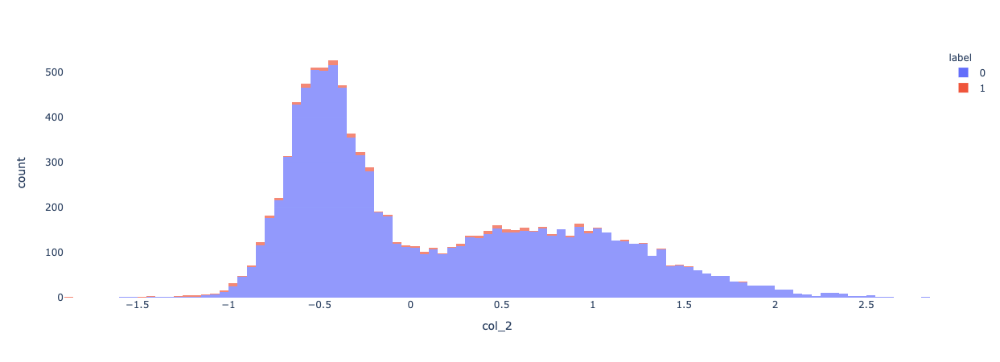

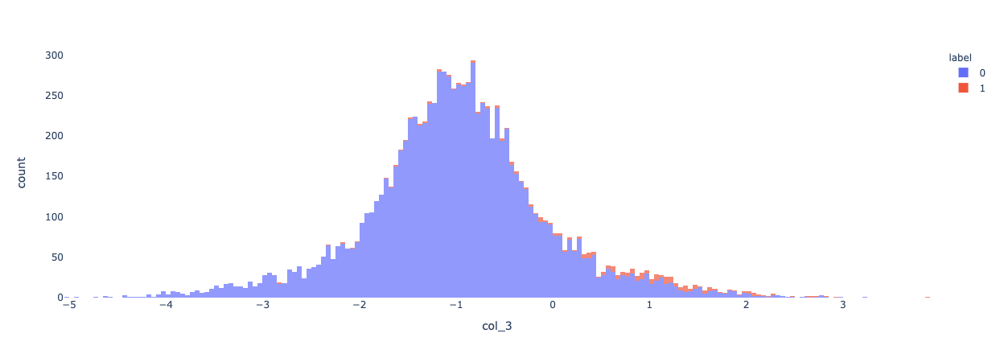

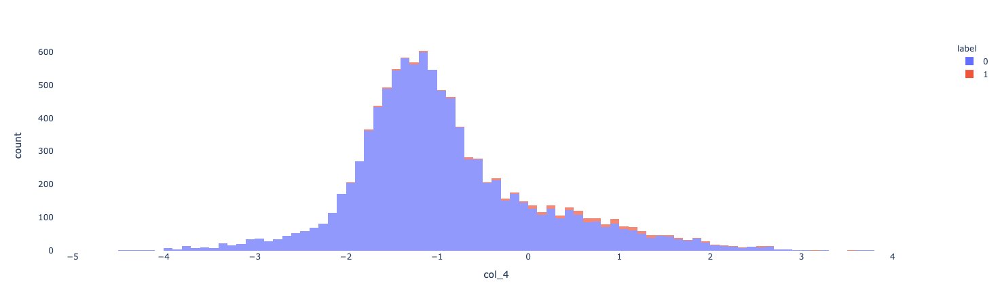

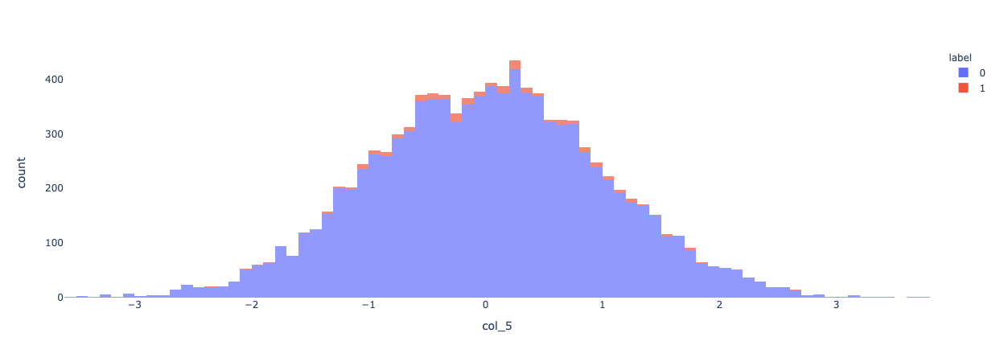

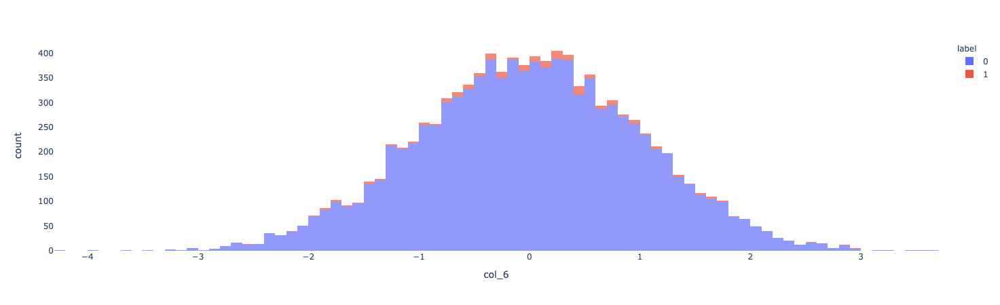

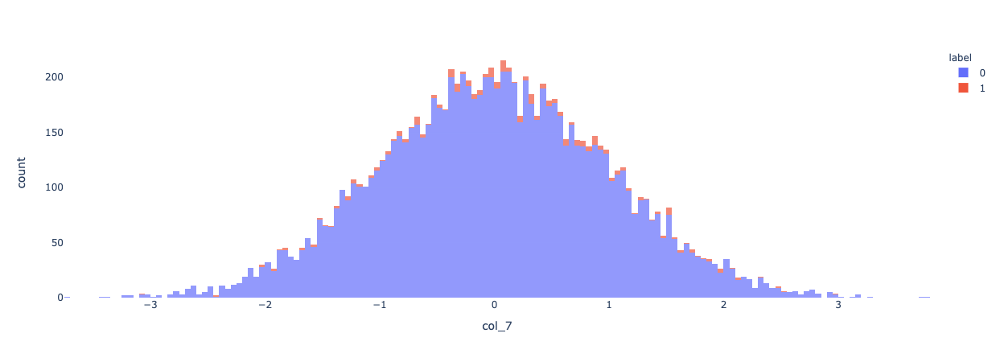

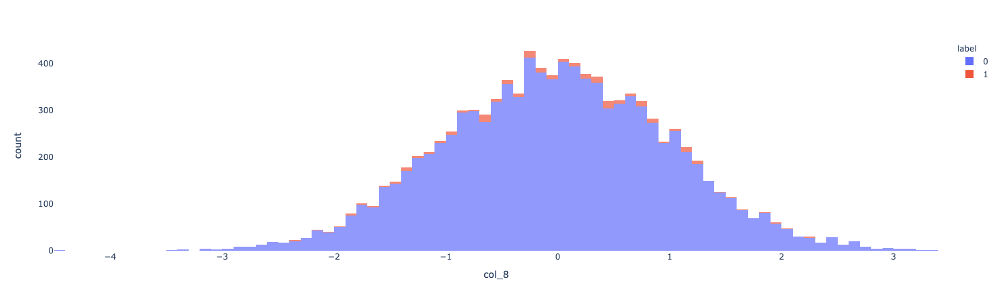

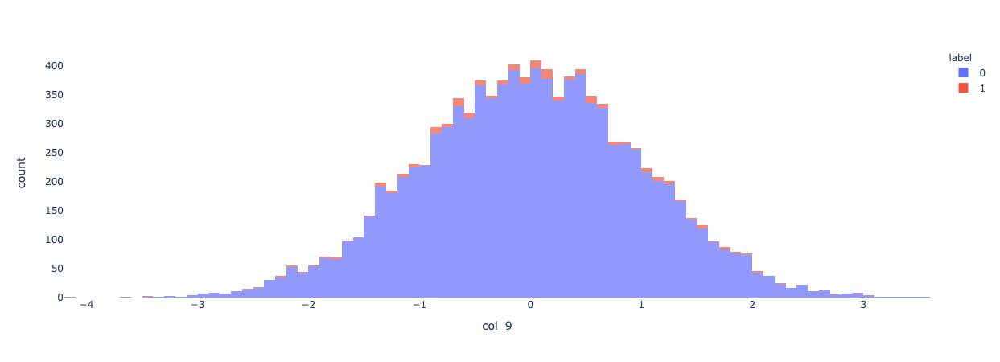

In [17]:
# Numerical
# Histograma con colores separados por 0 e 1
# Correlacion heatmap

for variable in numerical_features:
    fig = px.histogram(data, 
                       x= variable, 
                       color = target_column,
                       opacity = 0.7)
    
    fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                      plot_bgcolor='rgba(0,0,0,0)')
    fig.show()

# PREPARE DATASETS FOR TUNING AND TRAINING

In [18]:
train, valid = train_test_split(data, test_size = 0.20,random_state=40)
train, calib = train_test_split(train, test_size = 0.23,random_state=40)
train, test = train_test_split(train, test_size = 0.25,random_state=40)

print(f"train dataset size: {train.shape[0]} \ntrain umbalance: {train.loc[train[target_column]==1].shape[0]/train.shape[0]}")
print(f"train pct of data: {train.shape[0]/data.shape[0]} \n----------------------")

print(f"validate dataset size: {valid.shape[0]} \nvalidate umbalance: {valid.loc[valid[target_column]==1].shape[0]/valid.shape[0]}")
print(f"validate pct of data: {valid.shape[0]/data.shape[0]} \n----------------------")

print(f"calibrate dataset size: {calib.shape[0]} \nvalidate umbalance: {calib.loc[calib[target_column]==1].shape[0]/calib.shape[0]}")
print(f"calibrate pct of data: {calib.shape[0]/data.shape[0]} \n----------------------")

print(f"test dataset size: {test.shape[0]} \ntest umbalance: {test.loc[test[target_column]==1].shape[0]/test.shape[0]}")
print(f"test pct of data: {test.shape[0]/data.shape[0]} \n----------------------")

train dataset size: 4620 
train umbalance: 0.02554112554112554
train pct of data: 0.462 
----------------------
validate dataset size: 2000 
validate umbalance: 0.0175
validate pct of data: 0.2 
----------------------
calibrate dataset size: 1840 
validate umbalance: 0.027717391304347826
calibrate pct of data: 0.184 
----------------------
test dataset size: 1540 
test umbalance: 0.031818181818181815
test pct of data: 0.154 
----------------------


In [19]:
dummy_clf = DummyClassifier(strategy="most_frequent")
X = train.loc[:,categorical_features+numerical_features]
y = train.loc[:,[target_column]]

dummy_clf.fit(  train.loc[:,categorical_features+numerical_features], 
                train.loc[:,[target_column]]
                )

# NO SKILL AVERAGE PRECISION
no_skill_average_precision_score = average_precision_score(test[target_column].values,
                        dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
)

## NO SKILL AUC

fpr, tpr, thresholds = roc_curve(test[target_column].values, 
                                dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
                                    )
no_skill_auc = auc(fpr, tpr)

## NO SKILL LOGLOSS


no_skill_log_loss = log_loss(test[target_column].values, 
        dummy_clf.predict_proba(test.loc[:,categorical_features+numerical_features])[:,1]
        )

print(f"no skill auc: {round(no_skill_auc, 4)}")
print(f"no skill logloss: {round(no_skill_log_loss,4)}")
print(f"no skill average precision score: {round(no_skill_average_precision_score,4)}")


no skill auc: 0.5
no skill logloss: 1.099
no skill average precision score: 0.0318


In [20]:
#For categorical variables, we first need to impute NaN values, and then encode.
categorical_transformer = Pipeline(
        steps=[
            ("imputer", SimpleImputer(strategy="most_frequent")),
            ("encoder", OrdinalEncoder(handle_unknown="use_encoded_value", unknown_value=np.nan)),
            
        ]
    )
    
    #For numerical variables, we only use an imputer (no need to encode or scale)
numeric_transformer = SimpleImputer(strategy="most_frequent")
    
#Create preprocessor
preprocessor = ColumnTransformer(
        transformers=[
            ("cat", categorical_transformer, categorical_features),
            ("num", numeric_transformer, numerical_features),
        ]
    )


#Fit preprocessor to existing data
preprocessor.fit(train.loc[:, categorical_features+numerical_features])

print(preprocessor)

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('imputer',
                                                  SimpleImputer(strategy='most_frequent')),
                                                 ('encoder',
                                                  OrdinalEncoder(handle_unknown='use_encoded_value',
                                                                 unknown_value=nan))]),
                                 []),
                                ('num', SimpleImputer(strategy='most_frequent'),
                                 ['col_0', 'col_1', 'col_2', 'col_3', 'col_4',
                                  'col_5', 'col_6', 'col_7', 'col_8',
                                  'col_9'])])


In [21]:
# Transform x with preprocessor
X_train_transformed = pd.DataFrame(
        preprocessor.transform(
            train.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_calib_transformed = pd.DataFrame(
        preprocessor.transform(
            calib.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_valid_transformed = pd.DataFrame(
        preprocessor.transform(
            valid.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)

X_test_transformed = pd.DataFrame(
        preprocessor.transform(
            test.loc[:,categorical_features
                        +numerical_features]),
        columns=categorical_features+numerical_features)


# Create LGBM datasets
train_dset = lgb.Dataset(
        pd.DataFrame(X_train_transformed,
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label=train.loc[:,[target_column]],
        free_raw_data=False)

calib_dset = lgb.Dataset(
        pd.DataFrame(X_calib_transformed,
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label=calib.loc[:,[target_column]],
        free_raw_data=False)

valid_dset = lgb.Dataset(
        pd.DataFrame(X_valid_transformed, 
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label= valid.loc[:,[target_column]],
        free_raw_data=False)

test_dset = lgb.Dataset(
        pd.DataFrame(X_test_transformed, 
                    columns=categorical_features+numerical_features),
        categorical_feature=categorical_features,
        label= test.loc[:,[target_column]],
        free_raw_data=False)

## LGBM LOG LOSS OBJECTIVE
+ Metrics
+ ROC + PR curves

#### TUNE

In [22]:
def get_study_results(study:optuna.study)->dict:
    """_summary_

    Args:
        study (optuna.study): _description_

    Returns:
        dict: _description_
    """

    trial = study.best_trial
    study_params = trial.params

    fig = optuna.visualization.plot_slice(study, params=study_params)
    fig.show()
    
    fig = optuna.visualization.plot_param_importances(study)
    fig.show()
    
    print(f"-------------------------------------------------------- \n Number of finished trials: {len(study.trials)}")
    
    print("Best trial:")

    print("  Value: {}".format(trial.value))

    print("  Params: ")
    for key, value in study_params.items():
        print("    {}: {}".format(key, value))

    print("--------------------------------------------------------")

    return study_params

In [23]:
def log_loss_objective(trial,
                       train_dset,
                       valid_dset,
                       model_params,
                       predict_proba_func = predict_proba):
    
    params_for_tuning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                         }
    
    model_params.update(params_for_tuning)

    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 16:19:05,134] A new study created in memory with name: no-name-63d41d99-4095-4855-b13a-c9499d2eefdd
[I 2022-03-31 16:19:05,231] Trial 0 finished with value: 0.4960896419708239 and parameters: {'lambda_l1': 0.045821172155245206, 'lambda_l2': 2.84982512889424, 'num_leaves': 161, 'feature_fraction': 0.7500898159534062, 'bagging_fraction': 0.7605586075900828, 'bagging_freq': 5, 'min_child_samples': 27}. Best is trial 0 with value: 0.4960896419708239.


{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'verbosity': -1, 'seed': 62}


[I 2022-03-31 16:19:05,367] Trial 1 finished with value: 0.308210234639154 and parameters: {'lambda_l1': 3.0539108102076715e-05, 'lambda_l2': 7.854710370869068e-08, 'num_leaves': 93, 'feature_fraction': 0.6149758874546598, 'bagging_fraction': 0.9100420492302969, 'bagging_freq': 2, 'min_child_samples': 17}. Best is trial 0 with value: 0.4960896419708239.
[I 2022-03-31 16:19:05,454] Trial 2 finished with value: 0.20679692819713122 and parameters: {'lambda_l1': 1.4919894564635667e-05, 'lambda_l2': 1.4627741604755537e-07, 'num_leaves': 52, 'feature_fraction': 0.6347030821858697, 'bagging_fraction': 0.4689253618651727, 'bagging_freq': 7, 'min_child_samples': 11}. Best is trial 0 with value: 0.4960896419708239.
[I 2022-03-31 16:19:05,530] Trial 3 finished with value: 0.38270429707887027 and parameters: {'lambda_l1': 5.311684958421415e-07, 'lambda_l2': 0.9600133753014098, 'num_leaves': 133, 'feature_fraction': 0.4289042362187777, 'bagging_fraction': 0.4844215900814256, 'bagging_freq': 1, 'min

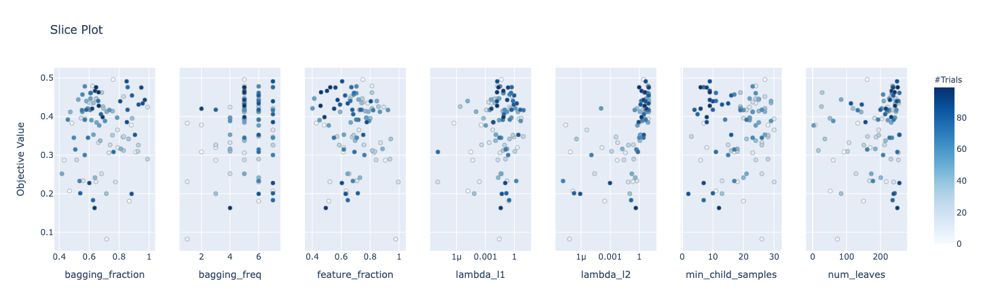

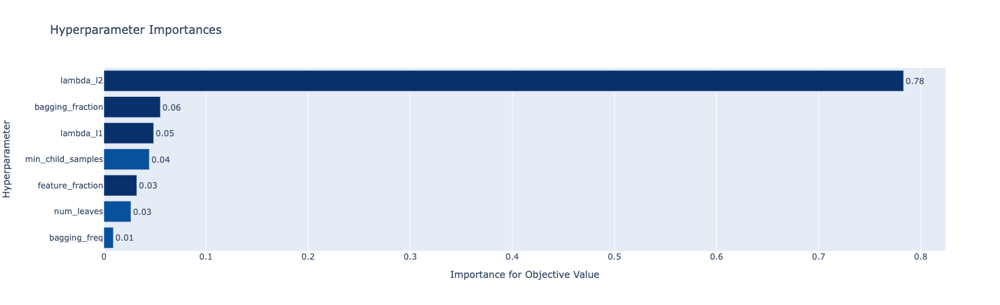

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.4960896419708239
  Params: 
    lambda_l1: 0.045821172155245206
    lambda_l2: 2.84982512889424
    num_leaves: 161
    feature_fraction: 0.7500898159534062
    bagging_fraction: 0.7605586075900828
    bagging_freq: 5
    min_child_samples: 27
--------------------------------------------------------
{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'verbosity': -1, 'seed': 62, 'lambda_l1': 0.022368487368188313, 'lambda_l2': 1.0068246825941702, 'num_leaves': 251, 'feature_fraction': 0.5244452360705881, 'bagging_fraction': 0.6464862344562855, 'bagging_freq': 5, 'min_child_samples': 6} 
 --------------------------------


In [24]:
params_logloss = {'objective': 'cross_entropy',
                  "boosting": "gbdt",
                  "deterministic":True,
                  "num_iterations": 10000, #Will have early stopping for tunning
                  'learning_rate':0.5,
                  'verbosity':-1,
                  'seed':62
                 }
    
print(params_logloss)
    
# -----------------------------------------------------
# TUNE LOSS FUNCTION
# -----------------------------------------------------
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)
log_Loss_study = optuna.create_study(pruner=pruner,
                                     direction='maximize')

log_Loss_study.optimize(lambda trial: log_loss_objective(trial,
                                                         train_dset,
                                                         valid_dset,
                                                         params_logloss),
                        n_trials=100)

best_params = get_study_results(log_Loss_study)
print(f"{params_logloss} \n --------------------------------")

#### TRAIN

In [25]:
#params_logloss['metric']=None
#params_logloss['early_stopping_round'] = 0
#params_logloss['num_iterations'] = int(np.median(best_iterations))
#params_logloss['seed'] = None

print(params_logloss)

lgbm_log_loss = lgb.train(params=params_logloss,
                          train_set=train_dset,
                          valid_sets=[valid_dset,],
                          
                          early_stopping_rounds = 25,
                          num_boost_round=10000,
                          
                          verbose_eval = False)
    
lgbm_log_loss.predict_proba = types.MethodType(predict_proba, lgbm_log_loss)

{'objective': 'cross_entropy', 'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'verbosity': -1, 'seed': 62, 'lambda_l1': 0.022368487368188313, 'lambda_l2': 1.0068246825941702, 'num_leaves': 251, 'feature_fraction': 0.5244452360705881, 'bagging_fraction': 0.6464862344562855, 'bagging_freq': 5, 'min_child_samples': 6}


#### CALIBRATE

In [26]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_log_loss.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.01167542 0.06451613 0.15789474 0.35294118 0.2        0.16666667
 0.33333333 0.         0.         0.         1.         0.
 0.33333333 0.         0.5        0.         0.5        0.4
 1.         0.75       0.6        1.        ]
[0.50093254 0.51360797 0.52404959 0.53435333 0.5412417  0.55502071
 0.56370748 0.57510796 0.58304169 0.59199722 0.60568855 0.61400281
 0.62410283 0.63707034 0.64337131 0.65650163 0.66586668 0.67465198
 0.69498532 0.70468737 0.71511176 0.73017437]


In [27]:
isotonic_log_loss = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_log_loss.fit(prob_pred,
                      prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [28]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [29]:
y_true = test_dset.label
probas_pred = (lgbm_log_loss.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_log_loss.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]


In [30]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)

print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.4416  
 AUC: 0.8497 
 LogLoss: 0.6958


In [31]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)

print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.4214  
 AUC: 0.8341 
 LogLoss: 0.0956


##### ROC / PR Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

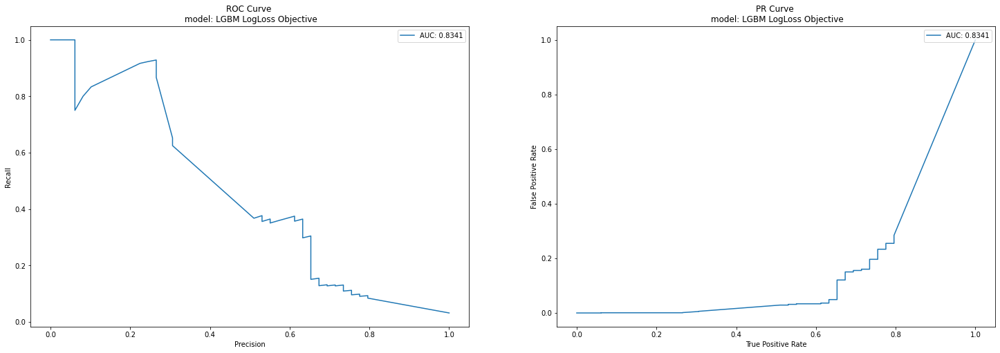

In [32]:
#Holis
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

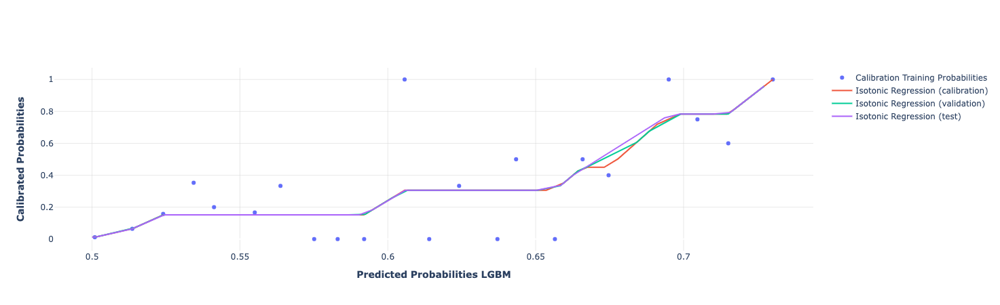

In [33]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_log_loss.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_log_loss.predict((lgbm_log_loss.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibration)'))

fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

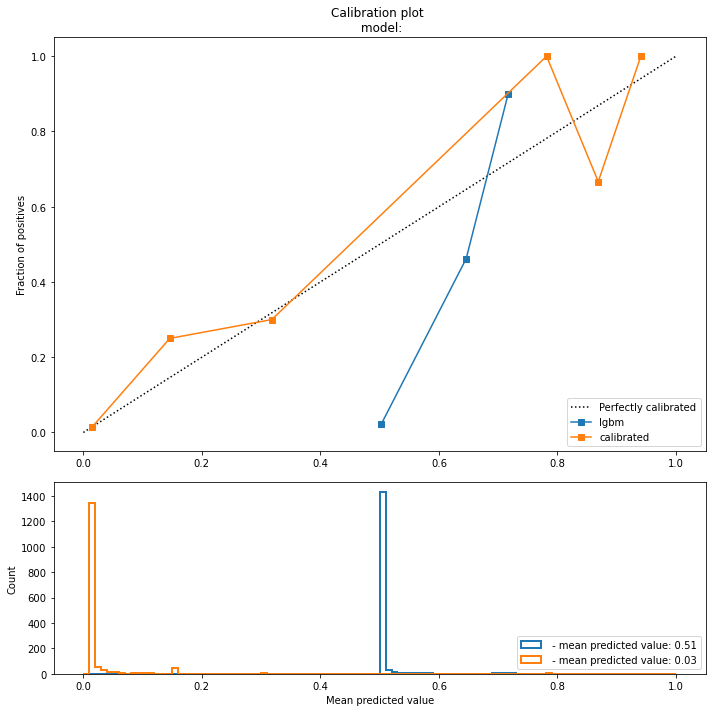

In [34]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=10)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=100, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model:') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

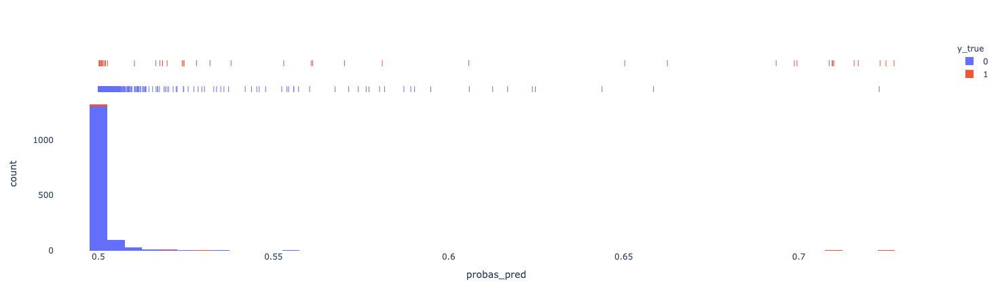

In [35]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'rug')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

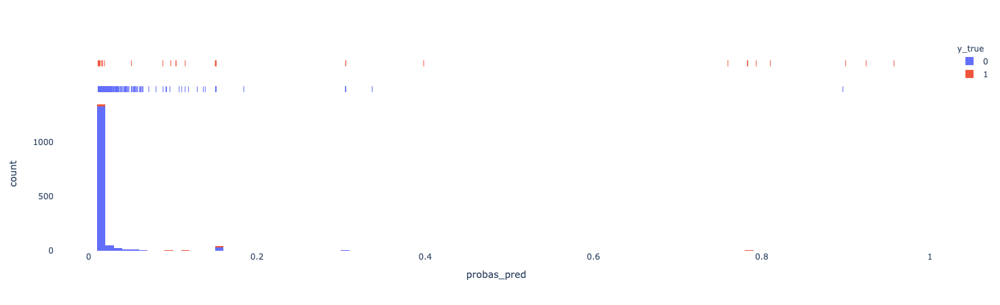

In [36]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred_calib}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'rug')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

## LGBM FOCAL LOSS OBJECTIVE (tuning all at once)


#### TUNE

In [37]:
def dual_loss_and_hyperparams_objective(trial, 
                                        train_dset,
                                        valid_dset,
                                        model_params,
                                        predict_proba_func = predict_proba):

    params_for_tuning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                          
                           "alpha":trial.suggest_float('alpha',0.5, 0.99),
                           "gamma":trial.suggest_float('gamma',0, 5)
                          }
    
    model_params.update(params_for_tuning)

    focal_loss = lambda x,y: focal_loss_lgb(x, y, params_for_tuning['alpha'], params_for_tuning['gamma'])
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, params_for_tuning['alpha'], params_for_tuning['gamma'])
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 16:19:21,945] A new study created in memory with name: no-name-15a54ca5-7b76-4248-abcb-f6ab5d24803d
[I 2022-03-31 16:19:22,155] Trial 0 finished with value: 0.36996224438247766 and parameters: {'lambda_l1': 1.7178257195607738e-05, 'lambda_l2': 0.08076002389390818, 'num_leaves': 4, 'feature_fraction': 0.7938662510014372, 'bagging_fraction': 0.4540904882125127, 'bagging_freq': 6, 'min_child_samples': 26, 'alpha': 0.796042671010726, 'gamma': 0.11612125858466549}. Best is trial 0 with value: 0.36996224438247766.
[I 2022-03-31 16:19:22,417] Trial 1 finished with value: 0.2596056418851948 and parameters: {'lambda_l1': 3.7156097444107643e-07, 'lambda_l2': 8.226165228273255e-07, 'num_leaves': 103, 'feature_fraction': 0.4295962387916759, 'bagging_fraction': 0.8148099770169985, 'bagging_freq': 7, 'min_child_samples': 12, 'alpha': 0.8139174095917996, 'gamma': 3.162245606388114}. Best is trial 0 with value: 0.36996224438247766.
[I 2022-03-31 16:19:22,664] Trial 2 finished with value:

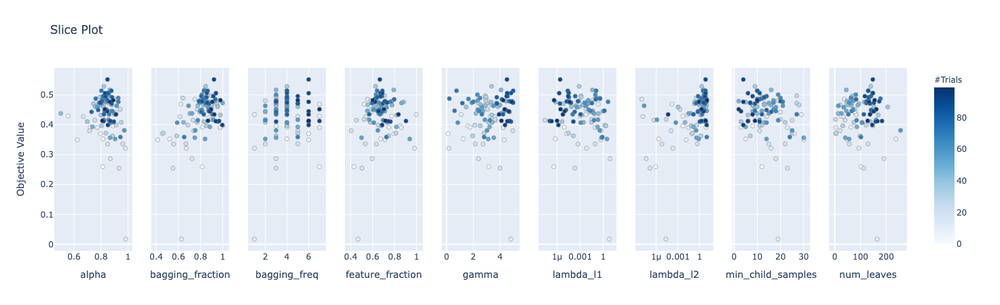

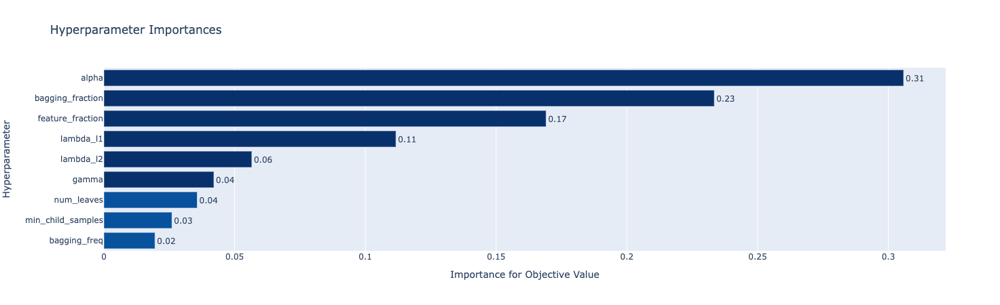

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.5514333973084362
  Params: 
    lambda_l1: 2.4848122208879728e-06
    lambda_l2: 6.626316449823153
    num_leaves: 148
    feature_fraction: 0.6653009577001943
    bagging_fraction: 0.9215557642595106
    bagging_freq: 6
    min_child_samples: 4
    alpha: 0.848159217832087
    gamma: 4.521136812349651
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'verbosity': -1, 'seed': 62, 'lambda_l1': 2.4848122208879728e-06, 'lambda_l2': 6.626316449823153, 'num_leaves': 148, 'feature_fraction': 0.6653009577001943, 'bagging_fraction': 0.9215557642595106, 'bagging_freq': 6, 'min_child_samples': 4, 'alpha': 0.848159217832087, 'gamma': 4.521136812349651} 
 --------------------------------


In [38]:
# Setup LGBM parameters that will not be subject to tuning
lgbm_focal_loss_1_params = {"boosting": "gbdt",
                            "deterministic":True,
                            "num_iterations": 10000, #Will have early stopping
                            'learning_rate':0.5,
                            'verbosity':-1,
                            'seed' : 62
                           }
    
# Create Optuna study
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)
dual_loss_hyperparams_study = optuna.create_study(pruner=pruner,
                                     direction='maximize')

# Optimize study
dual_loss_hyperparams_study.optimize(lambda trial: 
                                     dual_loss_and_hyperparams_objective(trial, 
                                                                         train_dset,
                                                                         valid_dset,
                                                                         lgbm_focal_loss_1_params), #Set up Optuna's objective function (see below)
                                     n_trials=100) #Set amount of trials

best_params = get_study_results(dual_loss_hyperparams_study)
    
# Update LGBM parameters with tuned parameters
lgbm_focal_loss_1_params.update(best_params)

print(f"{lgbm_focal_loss_1_params} \n --------------------------------")

#### TRAIN

In [39]:
#lgbm_focal_loss_1_params['metric']=None
#lgbm_focal_loss_1_params['early_stopping_round'] = 0
#lgbm_focal_loss_1_params['num_iterations'] = int(np.mean(best_iterations))
#lgbm_focal_loss_1_params['seed'] = None

print(lgbm_focal_loss_1_params)

focal_loss = lambda x,y: focal_loss_lgb(x, y, lgbm_focal_loss_1_params['alpha'], lgbm_focal_loss_1_params['gamma'])
focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, lgbm_focal_loss_1_params['alpha'], lgbm_focal_loss_1_params['gamma'])


lgbm_focal_loss_1 = lgb.train(params=lgbm_focal_loss_1_params,
                              
                              train_set=train_dset,
                              valid_sets=[valid_dset,],
                              
                              fobj = focal_loss,
                              feval = focal_loss_eval,
                              
                              early_stopping_rounds = 25,
                              num_boost_round=10000,
                              
                              verbose_eval = False)
    
lgbm_focal_loss_1.predict_proba = types.MethodType(predict_proba, lgbm_focal_loss_1)

{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'verbosity': -1, 'seed': 62, 'lambda_l1': 2.4848122208879728e-06, 'lambda_l2': 6.626316449823153, 'num_leaves': 148, 'feature_fraction': 0.6653009577001943, 'bagging_fraction': 0.9215557642595106, 'bagging_freq': 6, 'min_child_samples': 4, 'alpha': 0.848159217832087, 'gamma': 4.521136812349651}


#### CALIBRATE

In [40]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_focal_loss_1.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.00862069 0.01639344 0.01276596 0.00431034 0.00512821 0.
 0.         0.         0.01219512 0.01851852 0.01587302 0.
 0.         0.06451613 0.09090909 0.05555556 0.09090909 0.16666667
 0.4        0.08333333 0.2        0.         0.         0.25
 0.2        0.         0.4        0.55555556 0.2        0.25
 0.66666667 0.         1.         1.         0.8        1.        ]
[0.26515944 0.27509514 0.2855863  0.29470726 0.3041595  0.31450497
 0.32541371 0.3349568  0.34500686 0.35564431 0.36416142 0.37400081
 0.38442579 0.39461072 0.4037104  0.41486227 0.425205   0.43502574
 0.44353899 0.45437894 0.46469526 0.4742251  0.48397497 0.49448385
 0.50499077 0.51485652 0.52629044 0.53504611 0.54525067 0.55514113
 0.56689134 0.57571509 0.58664519 0.60118917 0.61548066 0.62642491]


In [41]:
isotonic_focal_loss_1 = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_focal_loss_1.fit(prob_pred, prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [42]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [43]:
y_true = test_dset.label
probas_pred = (lgbm_focal_loss_1.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_focal_loss_1.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]

In [44]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)


print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.5079  
 AUC: 0.8592 
 LogLoss: 0.4001


In [45]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)

print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}\n")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.4854  
 AUC: 0.8649 
 LogLoss: 0.085



##### ROC/PR Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

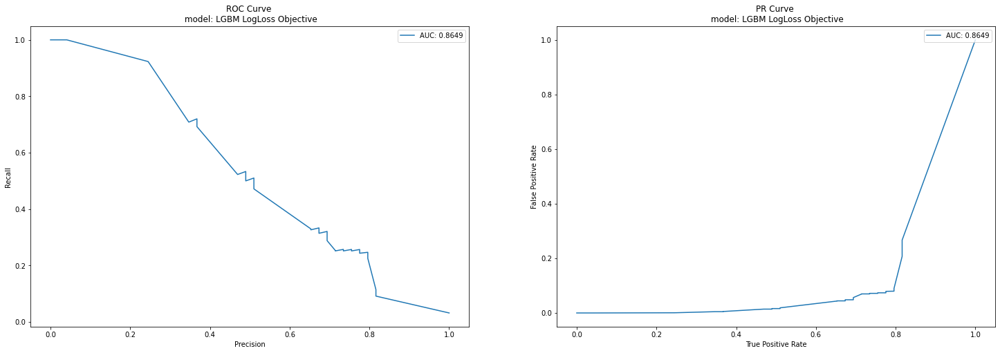

In [46]:
#Holis
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

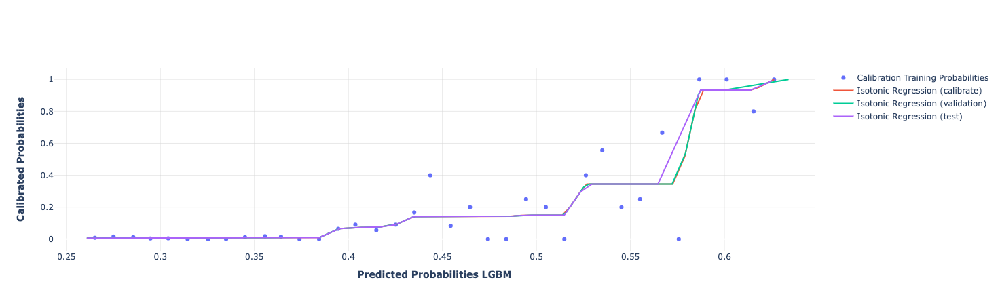

In [47]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_1.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_focal_loss_1.predict((lgbm_focal_loss_1.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibrate)'))

fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

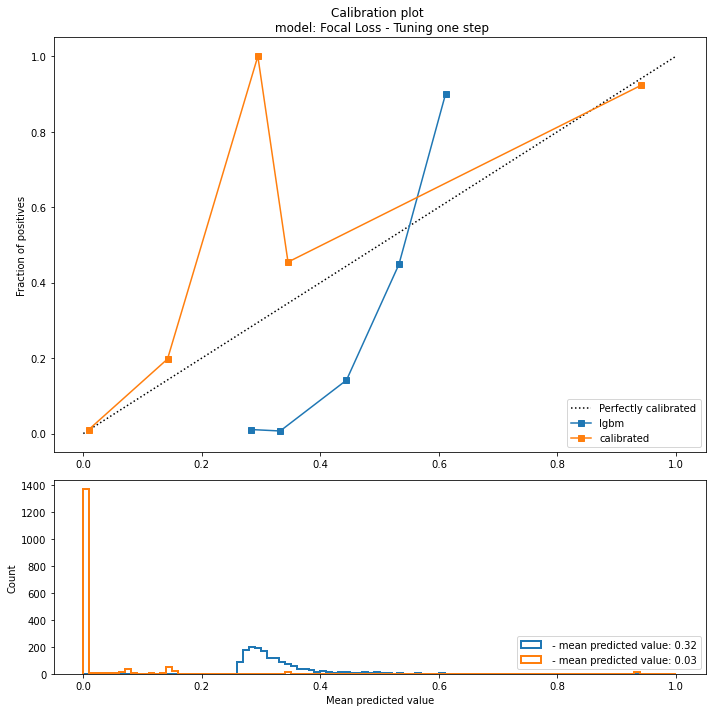

In [48]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=10)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=100, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model: Focal Loss - Tuning one step') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

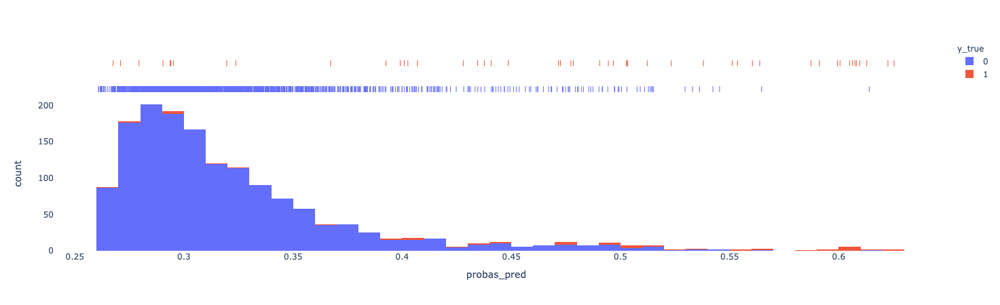

In [49]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'rug')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

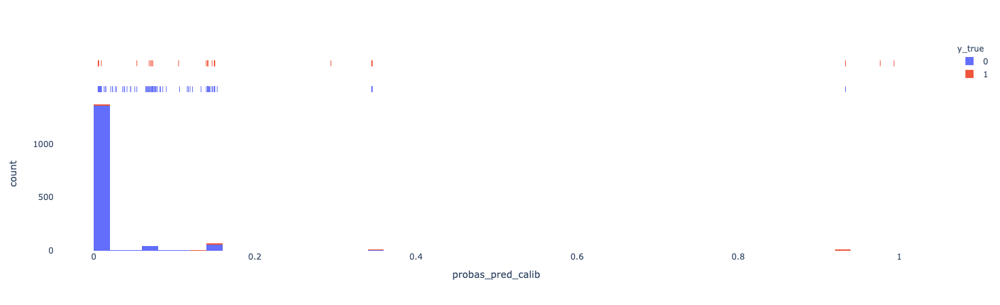

In [50]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred_calib': probas_pred_calib}),
                   x = 'probas_pred_calib',
                   color = 'y_true',
                  marginal = 'rug')

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

## LGBM FOCAL LOSS OBJECTIVE (tuning two steps)
+ Metrics
+ ROC + PR curves

#### TUNE

In [51]:
def loss_function_objective(trial,
                            train_dset,
                            valid_dset,
                            model_params,
                            predict_proba_func = predict_proba):

    
    # TUNNING
    # -------------------
    alpha = trial.suggest_float('alpha',0.5, 0.99)
    gamma = trial.suggest_float('gamma',0, 5)

    focal_loss = lambda x,y: focal_loss_lgb(x, y, alpha, gamma)
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, alpha, gamma)
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                          )

    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))

        
    return metric

In [52]:
def hyperparams_objective(trial,
                          train_dset,
                          valid_dset,
                          model_params,
                          predict_proba_func = predict_proba):
    # TUNNING
    # -------------------
    focal_loss = lambda x,y: focal_loss_lgb(x, y, model_params['alpha'], model_params['gamma'])
    focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, model_params['alpha'], model_params['gamma'])
    
    params_for_tunning =  {"lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
                           "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
                           "num_leaves": trial.suggest_int("num_leaves", 2, 256),
                           "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
                           "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
                           "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
                           "min_child_samples": trial.suggest_int("min_child_samples", 2, 30),
                          }
    
    model_params.update(params_for_tunning)
    
    lgbm_model = lgb.train(params=model_params,
                           
                           train_set=train_dset,
                           valid_sets=[valid_dset,],
                           
                           fobj = focal_loss,
                           feval = focal_loss_eval,
                           
                           early_stopping_rounds=25,
                           verbose_eval = False
                           )
    
    lgbm_model.predict_proba = types.MethodType(predict_proba_func, lgbm_model)

    
    # EVAL
    # -------------------
    
    #metric = log_loss(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    metric = average_precision_score(valid_dset.label, lgbm_model.predict_proba(valid_dset.data))
    
    return metric

[I 2022-03-31 16:19:57,601] A new study created in memory with name: no-name-8b98e55f-89e2-4bca-b207-28b0688e3e5b
[I 2022-03-31 16:19:57,846] Trial 0 finished with value: 0.4461772747901263 and parameters: {'alpha': 0.7518607358488976, 'gamma': 0.619708234194663}. Best is trial 0 with value: 0.4461772747901263.
[I 2022-03-31 16:19:58,102] Trial 1 finished with value: 0.4114826392721352 and parameters: {'alpha': 0.6378352626226138, 'gamma': 1.3332851036357045}. Best is trial 0 with value: 0.4461772747901263.
[I 2022-03-31 16:19:58,321] Trial 2 finished with value: 0.3829526050773666 and parameters: {'alpha': 0.8110589809900374, 'gamma': 1.1538987267944012}. Best is trial 0 with value: 0.4461772747901263.
[I 2022-03-31 16:19:58,543] Trial 3 finished with value: 0.3913440427104968 and parameters: {'alpha': 0.842024760673046, 'gamma': 2.364113514967915}. Best is trial 0 with value: 0.4461772747901263.
[I 2022-03-31 16:19:58,783] Trial 4 finished with value: 0.3844846086235982 and parameter

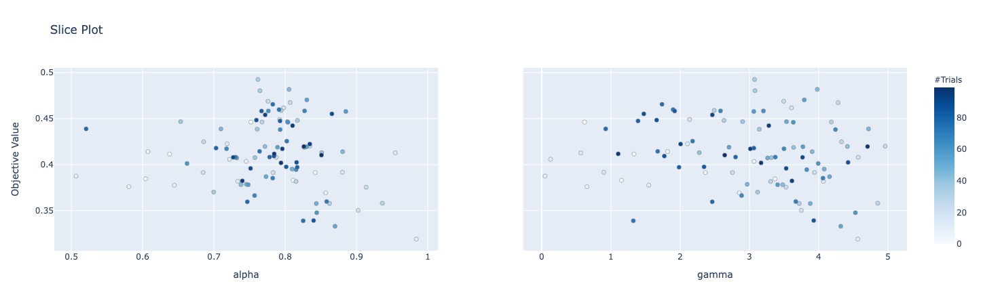

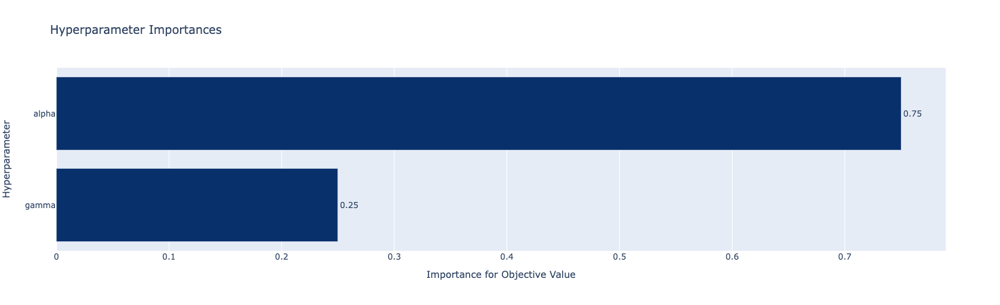

[I 2022-03-31 16:20:23,586] A new study created in memory with name: no-name-784a27a3-c32f-454b-8b4a-0570f8236355


-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.49261002430619333
  Params: 
    alpha: 0.7617024860147812
    gamma: 3.075052627010059
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'seed': 12, 'verbosity': -1, 'alpha': 0.7617024860147812, 'gamma': 3.075052627010059} 
 --------------------------------


[I 2022-03-31 16:20:23,806] Trial 0 finished with value: 0.4585289772256881 and parameters: {'lambda_l1': 1.8738490038910064e-07, 'lambda_l2': 8.616098084094849e-07, 'num_leaves': 45, 'feature_fraction': 0.8033083953508864, 'bagging_fraction': 0.5699080216828187, 'bagging_freq': 2, 'min_child_samples': 15}. Best is trial 0 with value: 0.4585289772256881.
[I 2022-03-31 16:20:24,038] Trial 1 finished with value: 0.39984326714803115 and parameters: {'lambda_l1': 0.015829092226411105, 'lambda_l2': 9.355702097325651e-08, 'num_leaves': 94, 'feature_fraction': 0.7092627093202286, 'bagging_fraction': 0.7052569858719034, 'bagging_freq': 5, 'min_child_samples': 2}. Best is trial 0 with value: 0.4585289772256881.
[I 2022-03-31 16:20:24,274] Trial 2 finished with value: 0.4258293077750083 and parameters: {'lambda_l1': 1.1556205793270349, 'lambda_l2': 2.5549164561123135e-08, 'num_leaves': 31, 'feature_fraction': 0.6757330694216174, 'bagging_fraction': 0.989937266494544, 'bagging_freq': 4, 'min_chil

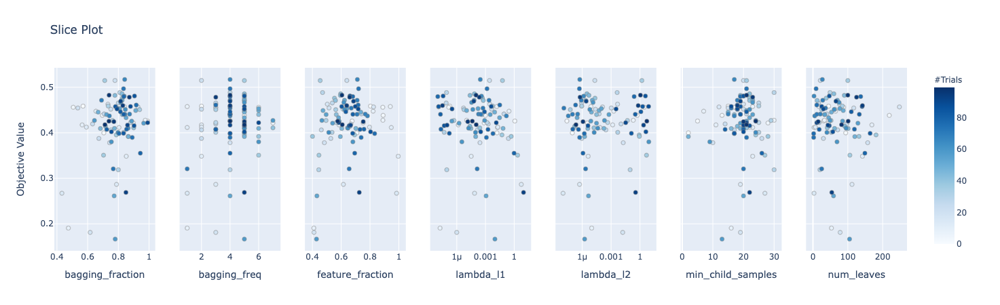

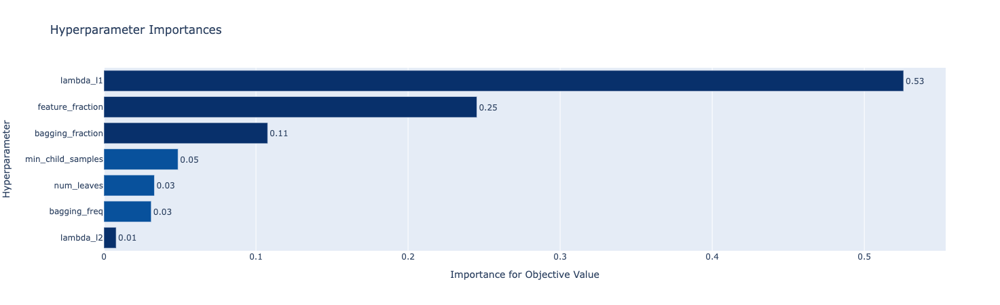

-------------------------------------------------------- 
 Number of finished trials: 100
Best trial:
  Value: 0.5171045904679387
  Params: 
    lambda_l1: 0.000286388630585336
    lambda_l2: 5.561748016741506e-07
    num_leaves: 27
    feature_fraction: 0.7121459711001412
    bagging_fraction: 0.8411828460486545
    bagging_freq: 4
    min_child_samples: 17
--------------------------------------------------------
{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'seed': 12, 'verbosity': -1, 'alpha': 0.7617024860147812, 'gamma': 3.075052627010059, 'lambda_l1': 0.000286388630585336, 'lambda_l2': 5.561748016741506e-07, 'num_leaves': 27, 'feature_fraction': 0.7121459711001412, 'bagging_fraction': 0.8411828460486545, 'bagging_freq': 4, 'min_child_samples': 17} 
 --------------------------------


In [53]:
lgbm_focal_loss_2_params = { "boosting": "gbdt",
                            "deterministic":True,
                            "num_iterations": 10000, #Will have early stopping for tunning
                            'learning_rate':0.5,
                            'seed':12,
                            'verbosity':-1}
    
# -----------------------------------------------------
# TUNE LOSS FUNCTION
# -----------------------------------------------------
pruner=optuna.pruners.PercentilePruner(25.0, n_startup_trials=5, n_warmup_steps=30, interval_steps=10)

loss_function_study = optuna.create_study(pruner=pruner,direction='maximize')
loss_function_study.optimize(lambda trial: 
                   loss_function_objective(trial,
                                           train_dset,
                                           valid_dset,
                                           lgbm_focal_loss_2_params),
                                n_trials=100)

best_params = get_study_results(loss_function_study)
    
del loss_function_study

lgbm_focal_loss_2_params.update(best_params)
print(f"{lgbm_focal_loss_2_params} \n --------------------------------")
 
    
# -----------------------------------------------------
# TUNE HYPERPARAMS
# -----------------------------------------------------
    
hyperparams_study = optuna.create_study(pruner=pruner,direction='maximize')
hyperparams_study.optimize(lambda trial: 
                   hyperparams_objective(trial,
                                         train_dset,
                                         valid_dset,
                                         lgbm_focal_loss_2_params),
                               n_trials=100)
    
best_params = get_study_results(hyperparams_study)
    
del hyperparams_study

lgbm_focal_loss_2_params.update(best_params)
print(f"{lgbm_focal_loss_2_params} \n --------------------------------")

#### TRAIN

In [54]:
#lgbm_focal_loss_2_params['metric']=None
#lgbm_focal_loss_2_params['early_stopping_round'] = 0
#lgbm_focal_loss_2_params['num_iterations'] = int(np.median(best_iterations))
#lgbm_focal_loss_2_params['seed'] = None

print(lgbm_focal_loss_2_params)

focal_loss = lambda x,y: focal_loss_lgb(x, y, lgbm_focal_loss_2_params['alpha'], lgbm_focal_loss_2_params['gamma'])
focal_loss_eval = lambda x,y: focal_loss_lgb_eval_error(x, y, lgbm_focal_loss_2_params['alpha'], lgbm_focal_loss_2_params['gamma'])

lgbm_focal_loss_2 = lgb.train(params=lgbm_focal_loss_2_params,
                              
                              train_set=train_dset,
                              valid_sets=[valid_dset,],
                              
                              fobj = focal_loss,
                              feval = focal_loss_eval,
                              
                              early_stopping_rounds = 25,
                              num_boost_round=10000,
                              
                              verbose_eval = False)
    
lgbm_focal_loss_2.predict_proba = types.MethodType(predict_proba, lgbm_focal_loss_2)

{'boosting': 'gbdt', 'deterministic': True, 'num_iterations': 10000, 'learning_rate': 0.5, 'seed': 12, 'verbosity': -1, 'alpha': 0.7617024860147812, 'gamma': 3.075052627010059, 'lambda_l1': 0.000286388630585336, 'lambda_l2': 5.561748016741506e-07, 'num_leaves': 27, 'feature_fraction': 0.7121459711001412, 'bagging_fraction': 0.8411828460486545, 'bagging_freq': 4, 'min_child_samples': 17}


#### CALIBRATE

In [66]:
prob_true, prob_pred = calibration_curve(calib_dset.label, lgbm_focal_loss_2.predict_proba(calib_dset.data), n_bins=100)
print(prob_true)
print(prob_pred)

[0.         0.00742115 0.00974659 0.         0.01369863 0.01234568
 0.01851852 0.         0.         0.06666667 0.02083333 0.
 0.         0.         0.10526316 0.125      0.07142857 0.
 0.11111111 0.         0.11111111 0.11111111 0.16666667 0.
 0.33333333 0.         0.         0.5        0.2        0.2
 0.33333333 0.16666667 1.         0.         0.5        0.2
 0.         0.         1.         0.33333333 0.         1.
 1.         0.5        1.         0.66666667 1.        ]
[0.21880993 0.22691293 0.23455015 0.24421399 0.25508159 0.26554549
 0.27447287 0.28597431 0.29559723 0.30447003 0.31499148 0.32483223
 0.33411401 0.34557088 0.35462939 0.3659839  0.37436585 0.38546348
 0.39544162 0.40538922 0.41496043 0.42564406 0.43592143 0.44166305
 0.45375883 0.46643901 0.47448203 0.48444556 0.49455748 0.50664443
 0.51401153 0.52589468 0.53283069 0.54297497 0.55153308 0.56345876
 0.57674099 0.59734056 0.60501814 0.61073562 0.62318179 0.63852514
 0.64746115 0.65422403 0.6652224  0.7056045  0.7506

In [67]:
isotonic_focal_loss_2 = IsotonicRegression(out_of_bounds='clip',y_min=0,y_max=1)
    
isotonic_focal_loss_2.fit(prob_pred, prob_true)

IsotonicRegression(out_of_bounds='clip', y_max=1, y_min=0)

In [68]:
calibs_train = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(calib_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(calib_dset.data))),
                             })

calibs_valid = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(valid_dset.data)),
                              'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(valid_dset.data))),
                             })

#### EVALUATE

##### Metrics

In [69]:
y_true = test_dset.label
probas_pred = (lgbm_focal_loss_2.predict_proba(test_dset.data))
label_pred = [1 if x >=0.5 else 0 for x in probas_pred]

probas_pred_calib = isotonic_focal_loss_2.predict(probas_pred)
label_pred_calib = [1 if x >=0.5 else 0 for x in probas_pred_calib]

In [70]:
avg_prec = round(average_precision_score(y_true, probas_pred),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred),4)

logloss = round(log_loss(y_true, probas_pred),4)


print(f"METRICS FOR LGBM LOGLOSS: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}")

METRICS FOR LGBM LOGLOSS: 
 ----------------------- 
 Average Precision Score  0.5226  
 AUC: 0.8508 
 LogLoss: 0.3218


In [71]:
avg_prec = round(average_precision_score(y_true, probas_pred_calib),4)

false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, probas_pred_calib)
precision, recall, thresholds = precision_recall_curve(y_true, probas_pred_calib)

pr_auc = round(auc(false_positive_rate, true_positive_rate),4)
roc_auc = round(roc_auc_score(y_true, probas_pred_calib),4)

logloss = round(log_loss(y_true, probas_pred_calib),4)

print(f"METRICS FOR LGBM LOGLOSS CALIBRATED: \n ----------------------- \n Average Precision Score  {avg_prec}  \n AUC: {pr_auc} \n LogLoss: {logloss}\n ")

METRICS FOR LGBM LOGLOSS CALIBRATED: 
 ----------------------- 
 Average Precision Score  0.5106  
 AUC: 0.8566 
 LogLoss: 0.0891
 


##### PR/ROC Curves

Text(0.5, 1.0, 'PR Curve \n model: LGBM LogLoss Objective')

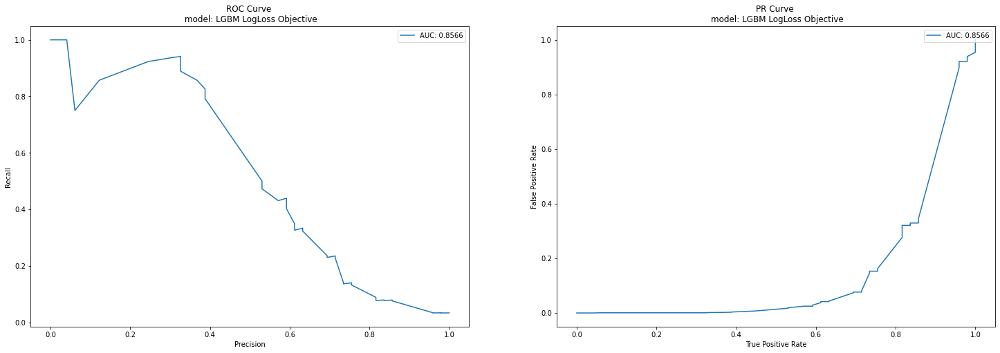

In [72]:
fig, axs = plt.subplots(1, 2, figsize = (25,8))

axs[0].plot(recall,precision, label = f"AUC: {pr_auc}")
axs[0].set_xlabel("Precision")
axs[0].set_ylabel("Recall")
axs[0].legend(loc="upper right")
axs[0].set_title(f'ROC Curve \n model: LGBM LogLoss Objective')

axs[1].plot(true_positive_rate,false_positive_rate,label = f"AUC: {pr_auc}")
axs[1].set_xlabel("True Positive Rate")
axs[1].set_ylabel("False Positive Rate")
axs[1].legend(loc="upper right")
axs[1].set_title(f'PR Curve \n model: LGBM LogLoss Objective')

##### Calibration Results

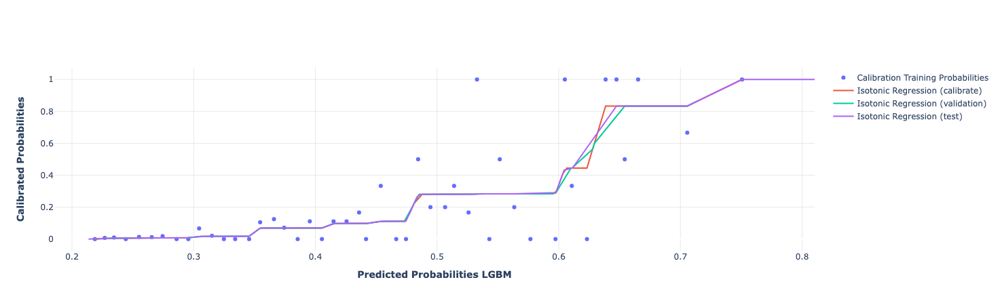

In [73]:
calibs_test = pd.DataFrame(data = {'prob_pred_lgbm':(lgbm_focal_loss_2.predict_proba(test_dset.data)),
                                   'prob_pred_calib':isotonic_focal_loss_2.predict((lgbm_focal_loss_2.predict_proba(test_dset.data)))
                                  })

fig = go.Figure()

fig.add_trace(go.Scatter(x=prob_pred, y=prob_true,
                    mode='markers',
                    name='Calibration Training Probabilities'))

fig.add_trace(go.Scatter(x=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_train.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (calibrate)'))

fig.add_trace(go.Scatter(x=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_valid.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (validation)'))

fig.add_trace(go.Scatter(x=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_lgbm'], 
                         y=calibs_test.sort_values('prob_pred_lgbm')['prob_pred_calib'],
                    mode='lines',
                    name='Isotonic Regression (test)'))

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')

fig.update_xaxes(title_text="<b>Predicted Probabilities LGBM</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')
fig.update_yaxes(title_text="<b>Calibrated Probabilities</b>", showgrid=True, gridwidth=0.5, gridcolor='LightGray')

#fig.update_traces(marker=dict(size=2))

fig.show()

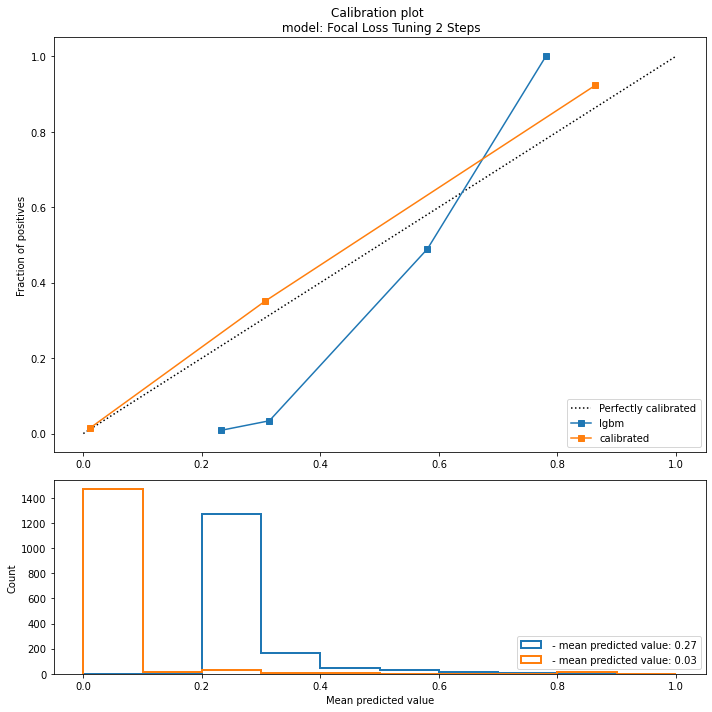

In [85]:
fig = plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))
    
ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")

probs = {'lgbm':probas_pred, 
         'calibrated':probas_pred_calib}

for name in ['lgbm','calibrated']:
    frac_of_pos, mean_pred_value = calibration_curve(test_dset.label, 
                                                     probs[name],
                                                     n_bins=4)

    ax1.plot(mean_pred_value, frac_of_pos, "s-", label=f'{name}')
    ax2.hist(probs[name], 
             range=(0, 1), 
             bins=10, 
             label=f' - mean predicted value: {round(np.mean(probs[name]),2)}',
             histtype="step", lw=2)
    
ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title(f'Calibration plot \n model: Focal Loss Tuning 2 Steps') #ToDo: Fix Name
    
    
ax2.legend(loc="lower right")
ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
    
plt.tight_layout()
plt.show()

##### Probability Histograms

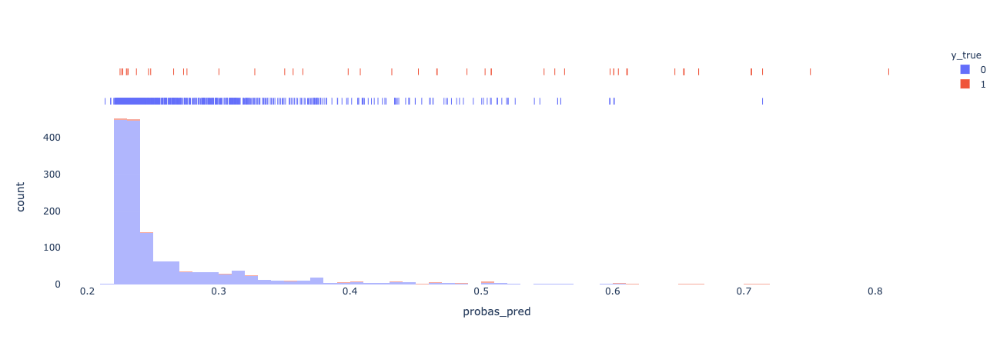

In [88]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred': probas_pred}),
                   x = 'probas_pred',
                   color = 'y_true',
                  marginal = 'rug',
                  opacity =0.5)

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()

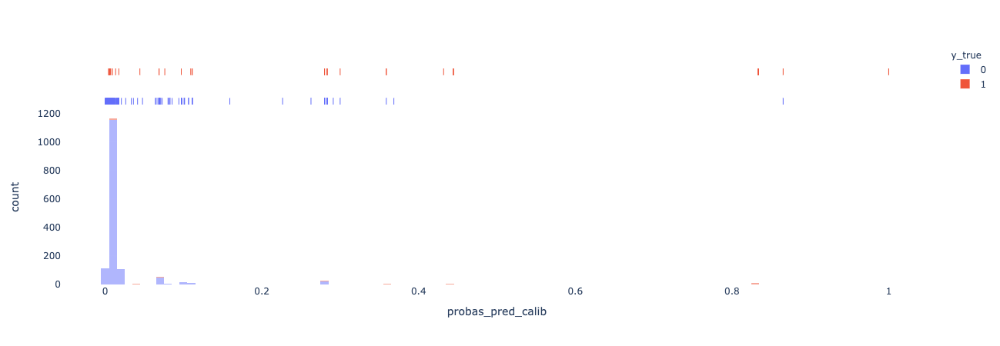

In [89]:
fig = px.histogram(pd.DataFrame(data= {'y_true': y_true[target_column].values, 'probas_pred_calib': probas_pred_calib}),
                   x = 'probas_pred_calib',
                   color = 'y_true',
                  marginal = 'rug',
                  opacity =0.5)

fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)')
fig.show()